In [125]:
import time
import imblearn
import numpy as np 
import pandas as pd
import seaborn as sns
import imblearn.over_sampling
import matplotlib.pyplot as plt
from sklearn import metrics
from pandas_profiling import ProfileReport
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import  LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import roc_curve
from imblearn.over_sampling import SMOTE
from collections import Counter

%matplotlib inline

pd.options.mode.chained_assignment = None  # default='warn'

In [126]:
#df=pd.read_csv('https://raw.githubusercontent.com/Jurisayigh/Hayat-Juri/main/Skyserver_SQL2_27_2018%206_51_39%20PM.csv?token=AVPWKZA2HILTC3UHXAFUQ5DBOL336')

In [127]:
df=pd.read_csv('./Skyserver_SQL2_27_2018_6_51_39_PM.csv')

In [128]:
df.head()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513
3,1.237650e+18,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,301,4,269,3.722370e+18,STAR,-0.000111,3306,54922,510
4,1.237650e+18,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,301,4,269,3.722370e+18,STAR,0.000590,3306,54922,512


In [129]:
df.info

<bound method DataFrame.info of              objid          ra        dec         u         g         r  \
0     1.237650e+18  183.531326   0.089693  19.47406  17.04240  15.94699   
1     1.237650e+18  183.598370   0.135285  18.66280  17.21449  16.67637   
2     1.237650e+18  183.680207   0.126185  19.38298  18.19169  17.47428   
3     1.237650e+18  183.870529   0.049911  17.76536  16.60272  16.16116   
4     1.237650e+18  183.883288   0.102557  17.55025  16.26342  16.43869   
...            ...         ...        ...       ...       ...       ...   
9995  1.237650e+18  131.316413  51.539547  18.81777  17.47053  16.91508   
9996  1.237650e+18  131.306083  51.671341  18.27255  17.43849  17.07692   
9997  1.237650e+18  131.552562  51.666986  18.75818  17.77784  17.51872   
9998  1.237650e+18  131.477151  51.753068  18.88287  17.91068  17.53152   
9999  1.237650e+18  131.665012  51.805307  19.27586  17.37829  16.30542   

             i         z   run  rerun  camcol  field     specobjid 

In [130]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
objid,10000.0,1.237650e+18,1.577039e+05,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18,1.237650e+18
ra,10000.0,1.755300e+02,4.778344e+01,8.235100e+00,1.573709e+02,1.803945e+02,2.015473e+02,2.608844e+02
dec,10000.0,1.483615e+01,2.521221e+01,-5.382632e+00,-5.390350e-01,4.041660e-01,3.564940e+01,6.854227e+01
u,10000.0,1.861936e+01,8.286560e-01,1.298897e+01,1.817803e+01,1.885309e+01,1.925923e+01,1.959990e+01
g,10000.0,1.737193e+01,9.454572e-01,1.279955e+01,1.681510e+01,1.749513e+01,1.801015e+01,1.991897e+01
r,10000.0,1.684096e+01,1.067764e+00,1.243160e+01,1.617333e+01,1.685877e+01,1.751267e+01,2.480204e+01
i,10000.0,1.658358e+01,1.141805e+00,1.194721e+01,1.585370e+01,1.655499e+01,1.725855e+01,2.817963e+01
z,10000.0,1.642283e+01,1.203188e+00,1.161041e+01,1.561829e+01,1.638994e+01,1.714145e+01,2.283306e+01
run,10000.0,9.810348e+02,2.733050e+02,3.080000e+02,7.520000e+02,7.560000e+02,1.331000e+03,1.412000e+03
rerun,10000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02


In [131]:
for cols in df.columns:
    print(cols,':',df[cols].nunique())

objid : 1
ra : 10000
dec : 10000
u : 9730
g : 9817
r : 9852
i : 9890
z : 9896
run : 23
rerun : 1
camcol : 6
field : 703
specobjid : 6349
class : 3
redshift : 9637
plate : 487
mjd : 355
fiberid : 892


In [132]:
df.shape

(10000, 18)

In [133]:
df.isnull().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

In [134]:
columns = df.columns
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': columns,
                                 'percent_missing': percent_missing})
missing_value_df.sort_values('percent_missing')

,column_name,percent_missing
objid,objid,0.0
plate,plate,0.0
redshift,redshift,0.0
class,class,0.0
specobjid,specobjid,0.0
field,field,0.0
camcol,camcol,0.0
rerun,rerun,0.0
run,run,0.0
z,z,0.0


In [135]:
df.describe()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.237650e+18,175.529987,14.836148,18.619355,17.371931,16.840963,16.583579,16.422833,981.034800,301.0,3.648700,302.380100,1.645022e+18,0.143726,1460.986400,52943.533300,353.069400
std,1.577039e+05,47.783439,25.212207,0.828656,0.945457,1.067764,1.141805,1.203188,273.305024,0.0,1.666183,162.577763,2.013998e+18,0.388774,1788.778371,1511.150651,206.298149
min,1.237650e+18,8.235100,-5.382632,12.988970,12.799550,12.431600,11.947210,11.610410,308.000000,301.0,1.000000,11.000000,2.995780e+17,-0.004136,266.000000,51578.000000,1.000000
25%,1.237650e+18,157.370946,-0.539035,18.178035,16.815100,16.173333,15.853705,15.618285,752.000000,301.0,2.000000,184.000000,3.389248e+17,0.000081,301.000000,51900.000000,186.750000
50%,1.237650e+18,180.394514,0.404166,18.853095,17.495135,16.858770,16.554985,16.389945,756.000000,301.0,4.000000,299.000000,4.966580e+17,0.042591,441.000000,51997.000000,351.000000
75%,1.237650e+18,201.547279,35.649397,19.259232,18.010145,17.512675,17.258550,17.141447,1331.000000,301.0,5.000000,414.000000,2.881300e+18,0.092579,2559.000000,54468.000000,510.000000
max,1.237650e+18,260.884382,68.542265,19.599900,19.918970,24.802040,28.179630,22.833060,1412.000000,301.0,6.000000,768.000000,9.468830e+18,5.353854,8410.000000,57481.000000,1000.000000


In [136]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

['STAR' 'GALAXY' 'QSO']


C:\Users\Jury\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='class', ylabel='count'>

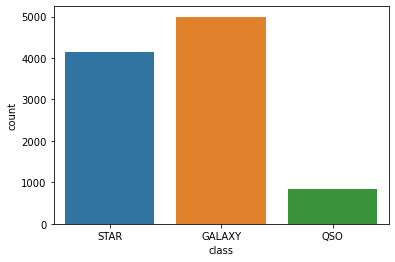

In [137]:
print(df['class'].unique())
sns.countplot(df['class'])

In [138]:
df=df.drop(['objid','rerun','specobjid','fiberid'],axis=1)

In [139]:
df.describe()

,ra,dec,u,g,r,i,z,run,camcol,field,redshift,plate,mjd
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,175.529987,14.836148,18.619355,17.371931,16.840963,16.583579,16.422833,981.034800,3.648700,302.380100,0.143726,1460.986400,52943.533300
std,47.783439,25.212207,0.828656,0.945457,1.067764,1.141805,1.203188,273.305024,1.666183,162.577763,0.388774,1788.778371,1511.150651
min,8.235100,-5.382632,12.988970,12.799550,12.431600,11.947210,11.610410,308.000000,1.000000,11.000000,-0.004136,266.000000,51578.000000
25%,157.370946,-0.539035,18.178035,16.815100,16.173333,15.853705,15.618285,752.000000,2.000000,184.000000,0.000081,301.000000,51900.000000
50%,180.394514,0.404166,18.853095,17.495135,16.858770,16.554985,16.389945,756.000000,4.000000,299.000000,0.042591,441.000000,51997.000000
75%,201.547279,35.649397,19.259232,18.010145,17.512675,17.258550,17.141447,1331.000000,5.000000,414.000000,0.092579,2559.000000,54468.000000
max,260.884382,68.542265,19.599900,19.918970,24.802040,28.179630,22.833060,1412.000000,6.000000,768.000000,5.353854,8410.000000,57481.000000


<AxesSubplot:>

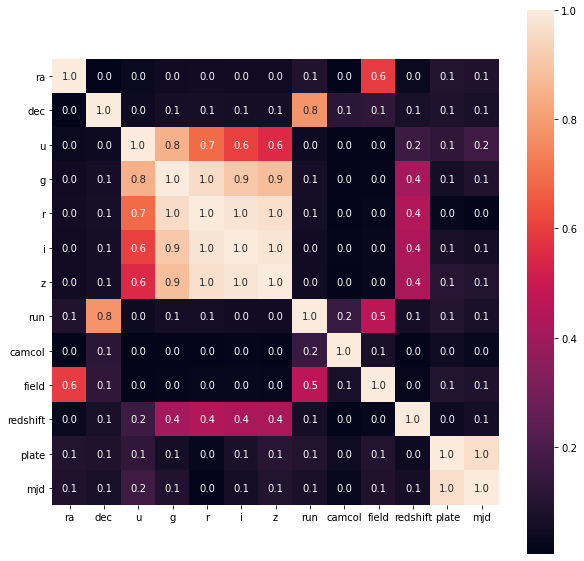

In [140]:
ax = plt.subplots(figsize=(10,10))
sns.heatmap(abs(df.corr()), annot=True,square=True,fmt=".1f")

In [141]:
df.corr()

,ra,dec,u,g,r,i,z,run,camcol,field,redshift,plate,mjd
ra,1.000000,0.003596,0.031238,0.043909,0.047103,0.045731,0.042950,-0.092741,-0.006294,0.594700,0.030307,-0.095329,-0.086887
dec,0.003596,1.000000,0.035279,0.061875,0.063404,0.058292,0.056870,0.778385,0.114614,-0.131471,0.067021,0.088342,0.066147
u,0.031238,0.035279,1.000000,0.849232,0.692379,0.602630,0.551483,0.038229,0.009945,0.008548,0.163741,-0.129430,-0.168793
g,0.043909,0.061875,0.849232,1.000000,0.958106,0.907419,0.879622,0.058446,0.010223,0.014651,0.407576,-0.054981,-0.092772
r,0.047103,0.063404,0.692379,0.958106,1.000000,0.977672,0.969197,0.057261,0.010747,0.017133,0.441080,0.019787,-0.009345
i,0.045731,0.058292,0.602630,0.907419,0.977672,1.000000,0.981507,0.049765,0.013461,0.019781,0.431450,0.072958,0.050896
z,0.042950,0.056870,0.551483,0.879622,0.969197,0.981507,1.000000,0.048252,0.010930,0.018248,0.424034,0.112397,0.095658
run,-0.092741,0.778385,0.038229,0.058446,0.057261,0.049765,0.048252,1.000000,0.151814,-0.463898,0.059056,0.093601,0.070354
camcol,-0.006294,0.114614,0.009945,0.010223,0.010747,0.013461,0.010930,0.151814,1.000000,-0.067921,0.006834,0.040795,0.026284
field,0.594700,-0.131471,0.008548,0.014651,0.017133,0.019781,0.018248,-0.463898,-0.067921,1.000000,0.015414,-0.093723,-0.086558


In [142]:
df.shape

(10000, 14)

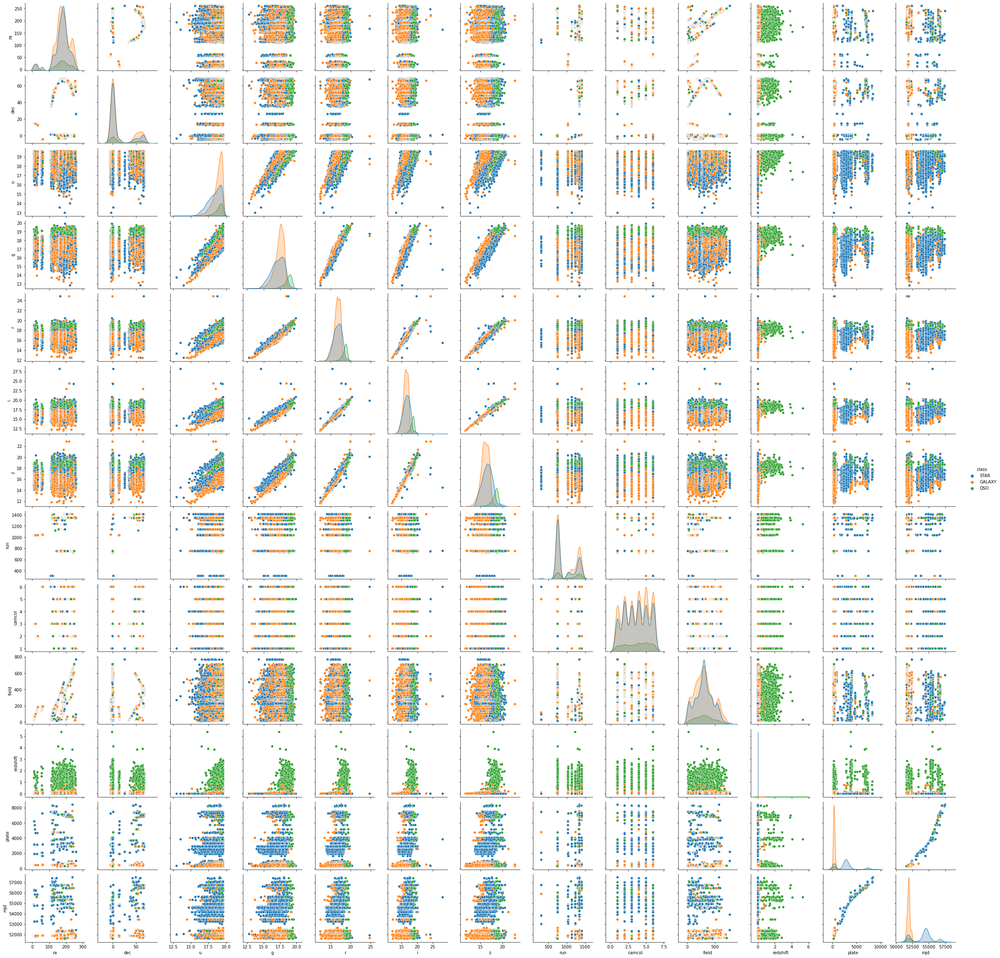

In [143]:
sns.pairplot(df,  hue="class")

In [144]:
# encode class labels to integers
y=df
le = LabelEncoder()
y_encoded = le.fit_transform(y['class'])
y['class'] = y_encoded

In [145]:
Xdf = df.drop('class', axis=1)
ydf = df['class']

In [146]:
Xdf

,ra,dec,u,g,r,i,z,run,camcol,field,redshift,plate,mjd
0,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,4,267,-0.000009,3306,54922
1,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,4,267,-0.000055,323,51615
2,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,4,268,0.123111,287,52023
3,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,4,269,-0.000111,3306,54922
4,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,4,269,0.000590,3306,54922
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,3,161,0.027583,447,51877
9996,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,3,162,0.117772,447,51877
9997,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,3,162,-0.000402,7303,57013
9998,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,3,163,0.014019,447,51877


In [147]:
ydf.value_counts()

0    4998
2    4152
1     850
Name: class, dtype: int64

In [148]:
ydf.value_counts()

0    4998
2    4152
1     850
Name: class, dtype: int64

In [197]:
X, X_test, y, y_test = train_test_split(Xdf, ydf, test_size=0.33, random_state=50, stratify = ydf)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [198]:
scaler = MinMaxScaler()

X_test = scaler.fit_transform(X_test)
X_train = scaler.fit_transform(X_train)
X_val = scaler.fit_transform(X_val)

In [199]:
knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)
y_pred = knn.predict(X_val)

target_names = ['STAR','GALAXY','QSO']
print(classification_report(y_val, y_pred, target_names=target_names))
print('Confusion Matrix: \n', confusion_matrix(y_val, y_pred))
knn_train_acc = knn.score(X_train, y_train)
print('Training Score: ', knn_train_acc)
knn_val_acc = knn.score(X_val, y_val)
print('validating Score: ', knn_val_acc)

              precision    recall  f1-score   support

        STAR       0.91      0.62      0.74       873
      GALAXY       0.48      0.95      0.64       112
         QSO       0.71      0.89      0.79       690

    accuracy                           0.75      1675
   macro avg       0.70      0.82      0.72      1675
weighted avg       0.80      0.75      0.75      1675

Confusion Matrix: 
 [[542  89 242]
 [  2 106   4]
 [ 50  26 614]]
Training Score:  0.8911442786069652
validating Score:  0.7534328358208955


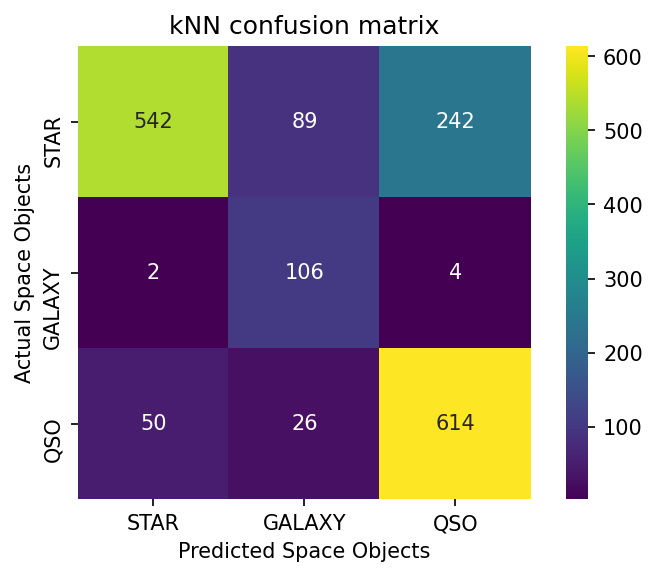

In [200]:
confusion = confusion_matrix(y_val, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space Objects')
plt.ylabel('Actual Space Objects')
plt.title('kNN confusion matrix');

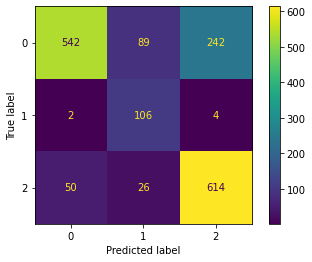

In [201]:
cm_knn=confusion_matrix(y_val, y_pred)
dis_knn=ConfusionMatrixDisplay(cm_knn)
dis_knn.plot()


In [202]:
oversample = SMOTE()
X_train, y_train = oversample.fit_resample(X_train, y_train)
counter = Counter(y_train)
print(counter)

Counter({2: 2476, 0: 2476, 1: 2476})


C:\Users\Jury\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='class', ylabel='count'>

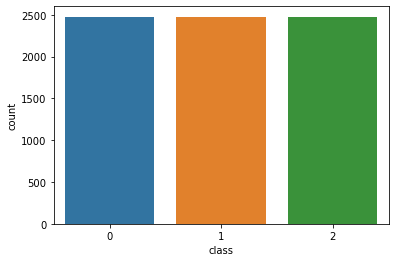

In [203]:
sns.countplot(y_train)

In [204]:
y_test.value_counts()

0    1649
2    1370
1     281
Name: class, dtype: int64

In [205]:
y_train.value_counts()

0    2476
1    2476
2    2476
Name: class, dtype: int64

In [206]:
y_val.value_counts()

0    873
2    690
1    112
Name: class, dtype: int64

In [207]:
X_test

array([[5.74717360e-01, 7.10152264e-02, 8.62121336e-01, ...,
        9.20254621e-03, 4.99313444e-04, 5.69413384e-02],
       [7.38458747e-01, 2.77432041e-02, 9.88541374e-01, ...,
        1.61643586e-02, 8.98764199e-03, 1.99552727e-02],
       [6.41969656e-01, 8.74762841e-02, 9.42121457e-01, ...,
        1.93311875e-02, 1.74759705e-03, 5.84895923e-03],
       ...,
       [7.86526720e-01, 9.79058878e-01, 8.39532337e-01, ...,
        3.33146022e-04, 2.88353514e-02, 7.07035954e-02],
       [9.17774989e-01, 7.84234330e-01, 8.94377937e-01, ...,
        2.07511907e-02, 4.43140682e-02, 8.20574574e-02],
       [8.50662760e-01, 7.88054991e-02, 9.16396652e-01, ...,
        4.32621659e-04, 3.33042067e-01, 5.24341992e-01]])

In [208]:
y.value_counts()

0    3349
2    2782
1     569
Name: class, dtype: int64

In [209]:
# print the shapes of the new X objects
print(X_train.shape)
print(X_test.shape)

(7428, 13)
(3300, 13)


In [210]:
# print the shapes of the new y objects
print(y_train.shape)
print(y_test.shape)

(7428,)
(3300,)


In [211]:
counter = Counter(y_train)
print(counter)

Counter({2: 2476, 0: 2476, 1: 2476})


In [212]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
preds = knn.predict(X_val)
acc_knn = (preds == y_val).sum().astype(float) / len(preds)*100
print("Accuracy of KNN: ", acc_knn)
print('Classification Report: \n', classification_report(y_val, preds))
print('Confusion Matrix: \n', confusion_matrix(y_val, preds))
knn_train_acc = knn.score(X_train, y_train)
print('Training Score: ', knn_train_acc)
knn_val_acc = knn.score(X_val, y_val)
print('Validating Score: ', knn_val_acc)

Accuracy of KNN:  62.98507462686567
Classification Report: 
               precision    recall  f1-score   support

           0       0.92      0.41      0.57       873
           1       0.26      0.97      0.41       112
           2       0.68      0.85      0.76       690

    accuracy                           0.63      1675
   macro avg       0.62      0.75      0.58      1675
weighted avg       0.78      0.63      0.63      1675

Confusion Matrix: 
 [[357 238 278]
 [  2 109   1]
 [ 29  72 589]]
Training Score:  0.942380183091007
Validating Score:  0.6298507462686567


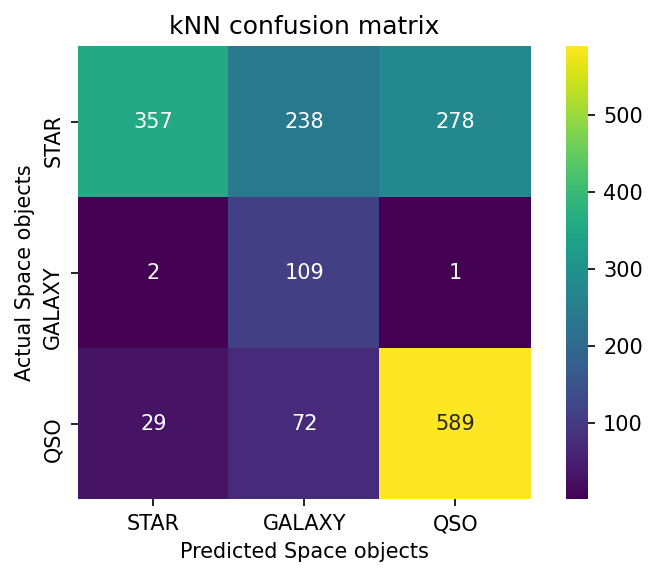

In [213]:
confusion = confusion_matrix(y_val, preds)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('kNN confusion matrix');

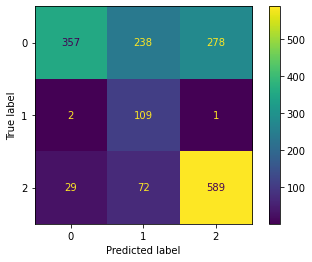

In [214]:
cm_knn1=confusion_matrix(y_val, preds)
dis_knn1=ConfusionMatrixDisplay(cm_knn1)
dis_knn1.plot()

In [215]:
knn = KNeighborsClassifier()
training_start = time.perf_counter()
knn.fit(X_train, y_train)
training_end = time.perf_counter()
prediction_start = time.perf_counter()
preds = knn.predict(X_val)
prediction_end = time.perf_counter()
acc_knn = (preds == y_val).sum().astype(float) / len(preds)*100
knn_train_time = training_end-training_start
knn_prediction_time = prediction_end-prediction_start
print("Scikit-Learn's K Nearest Neighbors Classifier's prediction accuracy is: %3.2f" % (acc_knn))
print("Time consumed for training: %4.3f seconds" % (knn_train_time))
print("Time consumed for prediction: %6.5f seconds" % (knn_prediction_time))

Scikit-Learn's K Nearest Neighbors Classifier's prediction accuracy is: 62.99
Time consumed for training: 0.041 seconds
Time consumed for prediction: 0.19056 seconds


In [216]:
# 10-fold cross-validation with K=10 for KNN (the n_neighbors parameter)
knn = KNeighborsClassifier(n_neighbors=10)
scores = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
print(scores)

[0.89502019 0.8909825  0.90578735 0.90713324 0.89636608 0.8923284
 0.88829071 0.90040377 0.89622642 0.91509434]


In [217]:
# use average accuracy as an estimate of out-of-sample accuracy
print(scores.mean())

0.8987633002361664


In [218]:
# search for an optimal value of K for KNN
k_range = list(range(1, 50))
k_scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
    k_scores.append(scores.mean())
print(np.max(k_scores))

0.9283833297660464


Text(0, 0.5, 'Cross-Validated Accuracy')

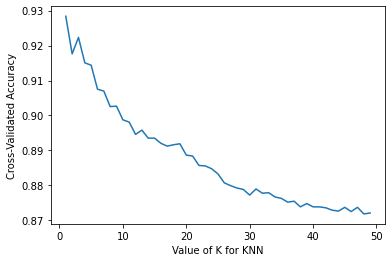

In [219]:
# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

In [220]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
preds = knn.predict(X_val)
acc_knn = (preds == y_val).sum().astype(float) / len(preds)*100
print("Accuracy of KNN: ", acc_knn)
print('Classification Report: \n', classification_report(y_val, preds))
print('Confusion Matrix: \n', confusion_matrix(y_val, preds))
knn_train_acc = knn.score(X_train, y_train)
print('Training Score: ', knn_train_acc)
knn_val_acc = knn.score(X_val, y_val)
print('Validating Score: ', knn_val_acc)

Accuracy of KNN:  63.582089552238806
Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.40      0.54       873
           1       0.46      0.95      0.62       112
           2       0.59      0.89      0.71       690

    accuracy                           0.64      1675
   macro avg       0.63      0.74      0.62      1675
weighted avg       0.72      0.64      0.62      1675

Confusion Matrix: 
 [[348 100 425]
 [  4 106   2]
 [ 56  23 611]]
Training Score:  1.0
Validating Score:  0.6358208955223881


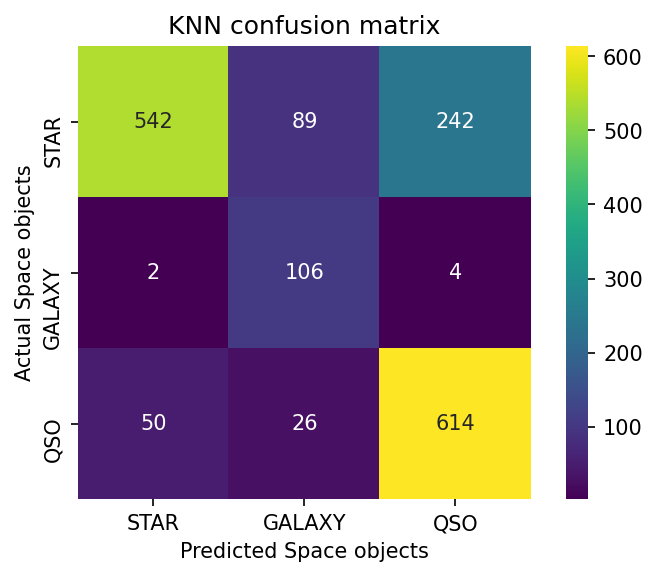

In [221]:
confusion = confusion_matrix(y_val, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('KNN confusion matrix');

In [222]:
lr = LogisticRegression(max_iter=120)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_val)
print('Classification Report: \n', classification_report(y_val, y_pred))
print('Confusion Matrix: \n', confusion_matrix(y_val, y_pred))
lr_train_acc = lr.score(X_train, y_train)
print('Training Score: ', lr_train_acc)
lr_val_acc = lr.score(X_val, y_val)
print('validating Score: ', lr_val_acc)

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.29      0.45       873
           1       0.45      0.99      0.62       112
           2       0.58      0.99      0.73       690

    accuracy                           0.63      1675
   macro avg       0.68      0.76      0.60      1675
weighted avg       0.79      0.63      0.58      1675

Confusion Matrix: 
 [[255 126 492]
 [  0 111   1]
 [  0   8 682]]
Training Score:  0.9190899299946149
validating Score:  0.6256716417910447


C:\Users\Jury\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


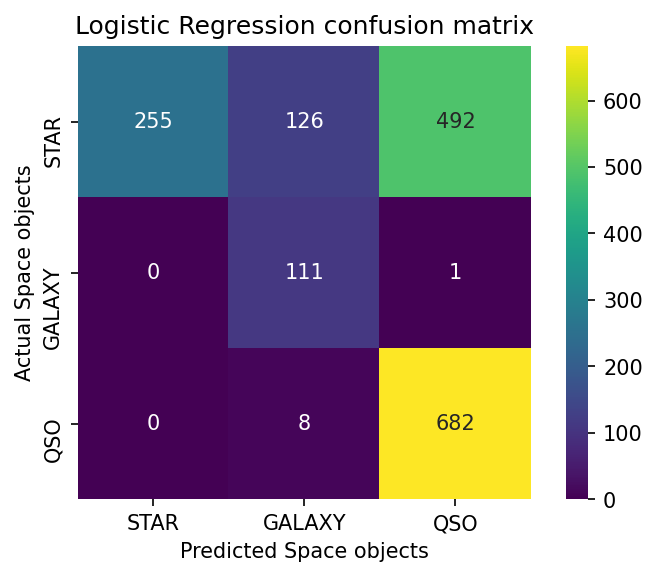

In [223]:
confusion = confusion_matrix(y_val, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('Logistic Regression confusion matrix');

Feature: 0, Score: 0.13340
Feature: 1, Score: 0.21651
Feature: 2, Score: 6.08314
Feature: 3, Score: 0.86740
Feature: 4, Score: -1.18421
Feature: 5, Score: -4.82829
Feature: 6, Score: -8.01894
Feature: 7, Score: 0.50049
Feature: 8, Score: -0.08072
Feature: 9, Score: -0.26661
Feature: 10, Score: -0.12081
Feature: 11, Score: -1.18206
Feature: 12, Score: -3.08866


<BarContainer object of 13 artists>

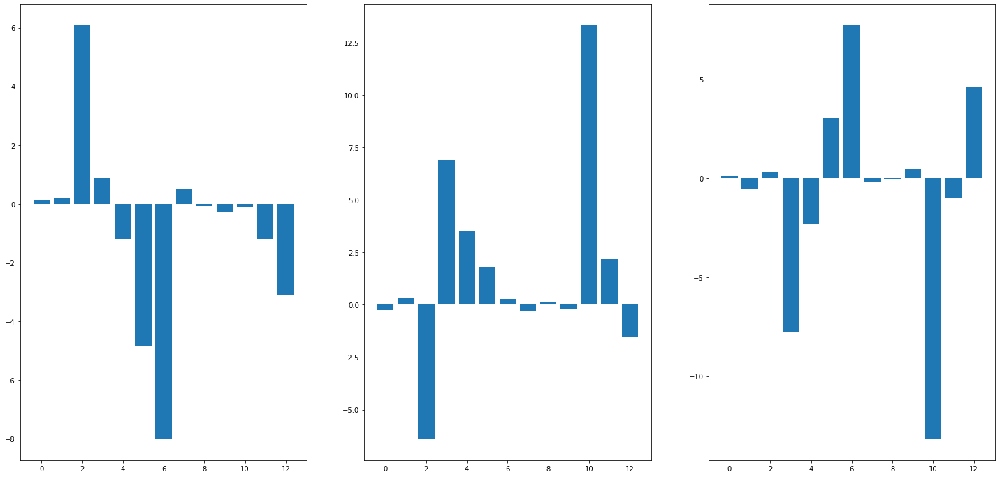

In [224]:
importance = lr.coef_
stars_co = importance[0]
galax_co = importance[1]
QSO_co = importance[2]
for i,v in enumerate(stars_co):
    print('Feature: %0d, Score: %.5f' % (i,v))

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (25,12))
# plot feature importance
ax1.bar(x = [x for x in range(len(galax_co))], height = stars_co)
ax2.bar(x = [x for x in range(len(galax_co))], height = galax_co)
ax3.bar(x = [x for x in range(len(QSO_co))], height = QSO_co)

In [225]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred = dt.predict(X_val)
print('Classification Report: \n', classification_report(y_val, y_pred))
print('Confusion Matrix: \n', confusion_matrix(y_val, y_pred))
dtc_train_acc = dt.score(X_train, y_train)
print('Training Score: ', dtc_train_acc)
dtc_val_acc = dt.score(X_val, y_val)
print('validating Score: ', dtc_val_acc)

Classification Report: 
               precision    recall  f1-score   support

           0       0.86      0.77      0.82       873
           1       0.02      0.04      0.03       112
           2       0.99      1.00      1.00       690

    accuracy                           0.82      1675
   macro avg       0.62      0.60      0.61      1675
weighted avg       0.86      0.82      0.84      1675

Confusion Matrix: 
 [[676 192   5]
 [108   4   0]
 [  1   0 689]]
Training Score:  1.0
validating Score:  0.8173134328358209


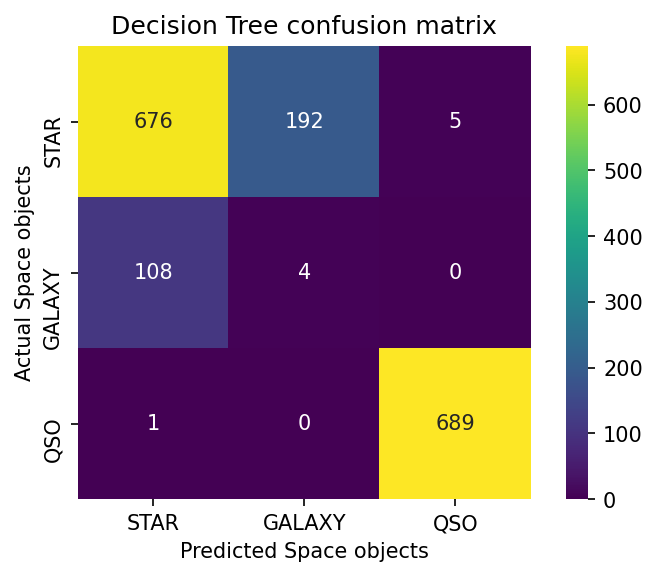

In [226]:
confusion = confusion_matrix(y_val, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('Decision Tree confusion matrix');

In [230]:
rfc = RandomForestClassifier(n_estimators=10)
training_start = time.perf_counter()
rfc.fit(X_train, y_train)
training_end = time.perf_counter()
prediction_start = time.perf_counter()
preds = rfc.predict(X_val)
prediction_end = time.perf_counter()
acc_rfc = (preds == y_val).sum().astype(float) / len(preds)*100
rfc_train_time = training_end-training_start
rfc_prediction_time = prediction_end-prediction_start
print("Scikit-Learn's Random Forest Classifier's prediction accuracy is: %3.2f" % (acc_rfc))
print("Time consumed for training: %4.3f seconds" % (rfc_train_time))
print("Time consumed for prediction: %6.5f seconds" % (rfc_prediction_time))
print('Classification Report: \n', classification_report(y_val, preds))
print('Confusion Matrix: \n', confusion_matrix(y_val, preds))
rfc_train_acc = rfc.score(X_train, y_train)
print('Training Score: ', rfc_train_acc)
rfc_val_acc = rfc.score(X_val, y_val)
print('validating Score: ', rfc_val_acc)

Scikit-Learn's Random Forest Classifier's prediction accuracy is: 89.13
Time consumed for training: 0.176 seconds
Time consumed for prediction: 0.00513 seconds
Classification Report: 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90       873
           1       0.20      0.20      0.20       112
           2       0.99      1.00      1.00       690

    accuracy                           0.89      1675
   macro avg       0.70      0.70      0.70      1675
weighted avg       0.89      0.89      0.89      1675

Confusion Matrix: 
 [[782  87   4]
 [ 90  22   0]
 [  1   0 689]]
Training Score:  0.9991922455573505
validating Score:  0.8913432835820896


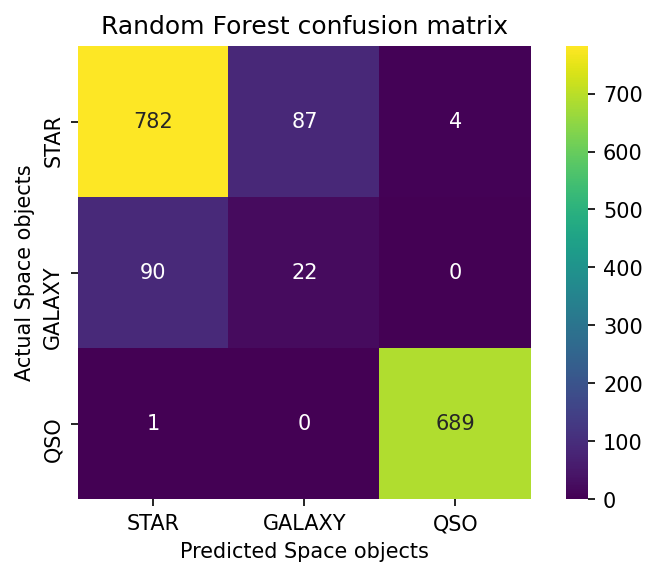

In [231]:
confusion = confusion_matrix(y_val, preds)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('Random Forest confusion matrix');

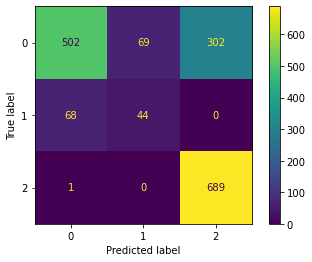

In [181]:
cm_rand1=confusion_matrix(y_val, preds)
dis_rand1=ConfusionMatrixDisplay(cm_rand1)
dis_rand1.plot()

In [182]:
results = pd.DataFrame({
    'Model': ['KNN','Random Forest'],
    'Score': [acc_knn, acc_rfc],
    'Runtime Training': [knn_train_time, rfc_train_time],
    'Runtime Prediction': [knn_prediction_time, rfc_prediction_time]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Model')
result_df

,Score,Runtime Training,Runtime Prediction
Model,,,
Random Forest,73.731343,0.136005,0.003408
KNN,63.761194,0.029290,0.128489


In [183]:
## after validation 
# now we merge train and validation together as train set and get the score on test set for final foundings

In [184]:
X_train = np.concatenate((X_train, X_val), axis=0)
y_train = np.concatenate((y_train, y_val), axis=0)

In [185]:
X_train

array([[0.93993391, 0.07879392, 0.47245634, ..., 0.00102552, 0.00982318,
        0.01447301],
       [0.64427156, 0.05996934, 0.79054224, ..., 0.01136201, 0.00184185,
        0.00102162],
       [0.62690824, 0.06541778, 0.99204094, ..., 0.02329225, 0.00147348,
        0.04971905],
       ...,
       [0.6534974 , 0.95239142, 0.84769884, ..., 0.04136775, 0.04175076,
        0.07785258],
       [0.45448263, 0.70217987, 0.83724678, ..., 0.01781321, 0.02207366,
        0.04488175],
       [0.67526875, 0.07225513, 0.96233481, ..., 0.02808548, 0.00227043,
        0.05782841]])

In [186]:
y_train

array([2, 0, 0, ..., 0, 0, 0])

In [187]:
knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

target_names = ['STAR','GALAXY','QSO']
print(classification_report(y_test, y_pred, target_names=target_names))
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))
knn_train_acc = knn.score(X_train, y_train)
print('Training Score: ', knn_train_acc)
knn_test_acc = knn.score(X_test, y_test)
print('testing Score: ', knn_test_acc)

              precision    recall  f1-score   support

        STAR       0.87      0.93      0.90      1649
      GALAXY       0.84      0.82      0.83       281
         QSO       0.91      0.84      0.87      1370

    accuracy                           0.88      3300
   macro avg       0.87      0.86      0.87      3300
weighted avg       0.89      0.88      0.88      3300

Confusion Matrix: 
 [[1538   11  100]
 [  36  231   14]
 [ 189   33 1148]]
Training Score:  0.9126661540151598
testing Score:  0.8839393939393939


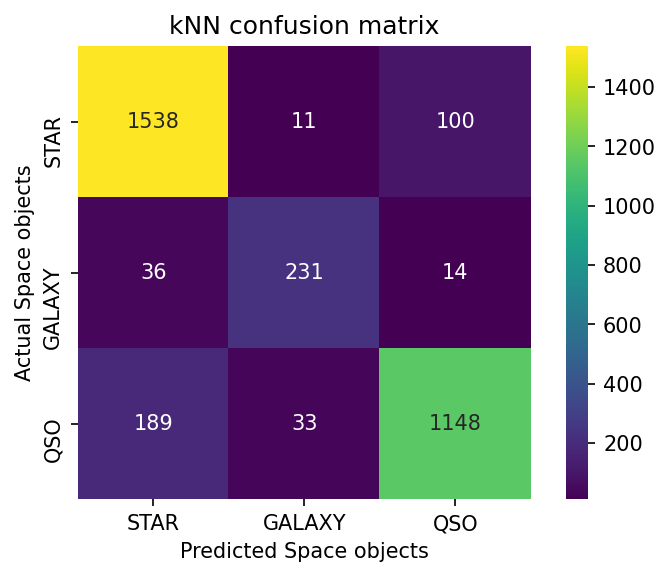

In [188]:
confusion = confusion_matrix(y_test, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('kNN confusion matrix');

In [189]:
lr = LogisticRegression(max_iter=120)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print('Classification Report: \n', classification_report(y_test, y_pred))
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))
lr_train_acc = lr.score(X_train, y_train)
print('Training Score: ', lr_train_acc)
lr_test_acc = lr.score(X_test, y_test)
print('Testing Score: ', lr_test_acc)

Classification Report: 
               precision    recall  f1-score   support

           0       0.98      0.54      0.70      1649
           1       0.97      0.91      0.94       281
           2       0.64      0.99      0.78      1370

    accuracy                           0.76      3300
   macro avg       0.86      0.81      0.81      3300
weighted avg       0.84      0.76      0.75      3300

Confusion Matrix: 
 [[ 898    7  744]
 [   7  255   19]
 [  12    1 1357]]
Training Score:  0.9211249038778425
Testing Score:  0.7606060606060606


C:\Users\Jury\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


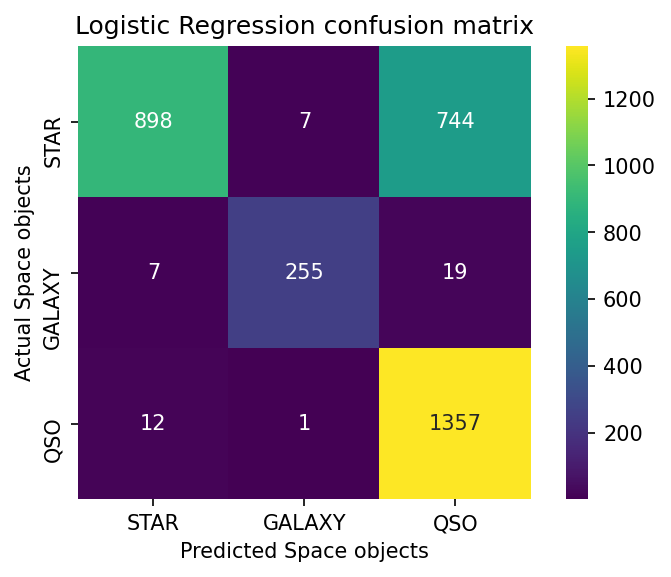

In [190]:
confusion = confusion_matrix(y_test, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('Logistic Regression confusion matrix');

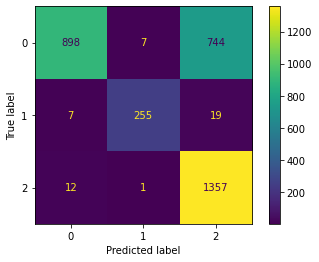

In [191]:
cm_rand2=confusion_matrix(y_test, y_pred)
dis_rand2=ConfusionMatrixDisplay(cm_rand2)
dis_rand2.plot()

In [192]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
print('Classification Report: \n', classification_report(y_test, y_pred))
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))
dtc_train_acc = dt.score(X_train, y_train)
print('Training Score: ', dtc_train_acc)
dtc_test_acc = dt.score(X_test, y_test)
print('Testing Score: ', dtc_test_acc)

Classification Report: 
               precision    recall  f1-score   support

           0       0.97      0.96      0.97      1649
           1       0.82      0.86      0.84       281
           2       0.99      0.99      0.99      1370

    accuracy                           0.97      3300
   macro avg       0.93      0.94      0.93      3300
weighted avg       0.97      0.97      0.97      3300

Confusion Matrix: 
 [[1586   52   11]
 [  38  243    0]
 [  14    0 1356]]
Training Score:  1.0
Testing Score:  0.9651515151515152


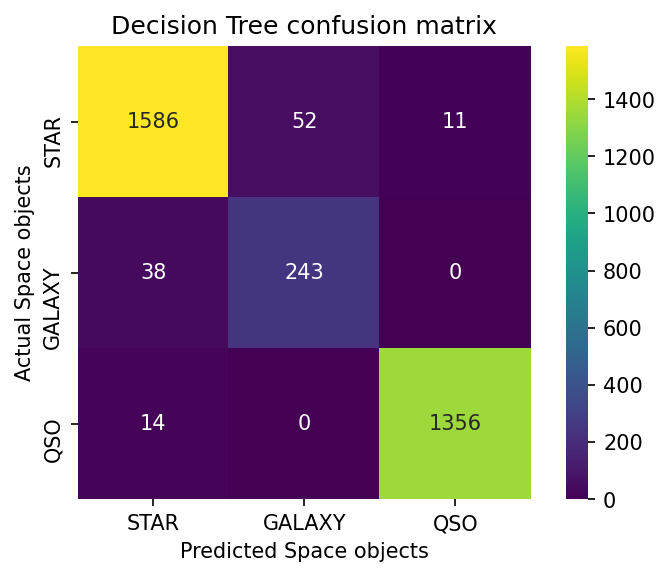

In [193]:
confusion = confusion_matrix(y_test, y_pred)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted Space objects')
plt.ylabel('Actual Space objects')
plt.title('Decision Tree confusion matrix');

In [194]:
rfc = RandomForestClassifier(n_estimators=10)
training_start = time.perf_counter()
rfc.fit(X_train, y_train)
training_end = time.perf_counter()
prediction_start = time.perf_counter()
preds = rfc.predict(X_test)
prediction_end = time.perf_counter()
acc_rfc = (preds == y_test).sum().astype(float) / len(preds)*100
rfc_train_time = training_end-training_start
rfc_prediction_time = prediction_end-prediction_start
print("Scikit-Learn's Random Forest Classifier's prediction accuracy is: %3.2f" % (acc_rfc))
print("Time consumed for training: %4.3f seconds" % (rfc_train_time))
print("Time consumed for prediction: %6.5f seconds" % (rfc_prediction_time))
print('Classification Report: \n', classification_report(y_test, preds))
print('Confusion Matrix: \n', confusion_matrix(y_test, preds))
rfc_train_acc = rfc.score(X_train, y_train)
print('Training Score: ', rfc_train_acc)
rfc_test_acc = rfc.score(X_test, y_test)
print('Testing Score: ', rfc_test_acc)

Scikit-Learn's Random Forest Classifier's prediction accuracy is: 98.21
Time consumed for training: 0.215 seconds
Time consumed for prediction: 0.00603 seconds
Classification Report: 
               precision    recall  f1-score   support

           0       0.98      0.99      0.98      1649
           1       0.96      0.87      0.91       281
           2       0.99      1.00      1.00      1370

    accuracy                           0.98      3300
   macro avg       0.98      0.95      0.96      3300
weighted avg       0.98      0.98      0.98      3300

Confusion Matrix: 
 [[1627    9   13]
 [  37  244    0]
 [   0    0 1370]]
Training Score:  0.9993408766340767
Testing Score:  0.9821212121212122


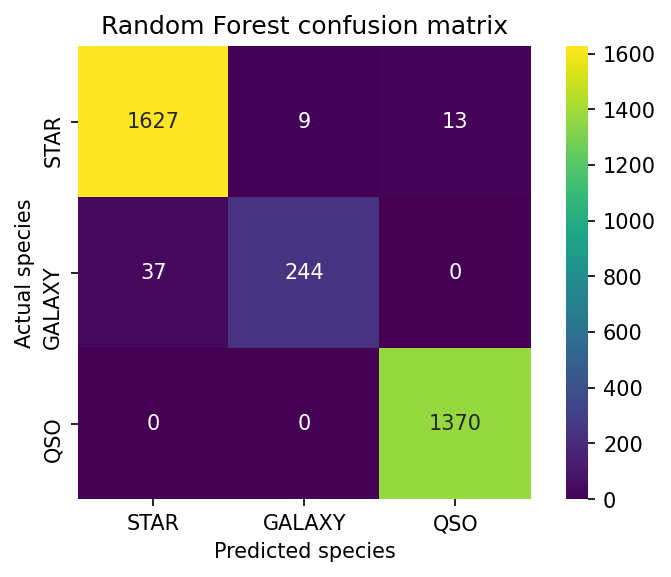

In [195]:
confusion = confusion_matrix(y_test, preds)
plt.figure(dpi=150)

sns.heatmap(confusion, cmap=plt.cm.viridis, annot=True, square=True, fmt='d',
           xticklabels=['STAR','GALAXY','QSO'],
           yticklabels=['STAR','GALAXY','QSO'])

plt.xlabel('Predicted species')
plt.ylabel('Actual species')
plt.title('Random Forest confusion matrix');

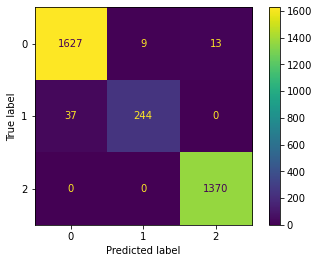

In [196]:
cm_dt1=confusion_matrix(y_test, preds)
dis_dt1=ConfusionMatrixDisplay(cm_dt1)
dis_dt1.plot()